In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mimg
from tqdm import tqdm_notebook as tqdm
import os
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
import imageio

In [4]:
ID_TO_CLASSNAME = '/home/trejsu/projects/shaper_data/LOC_synset_mapping.txt/id-class-mapping.txt'
IMG_TO_ID = '/home/trejsu/projects/shaper_data/img-id-mapping.txt'
IMG_TO_CLASSNAME = '/home/trejsu/projects/shaper_data/img-class-mapping.txt'

In [3]:
id_class_df = pd.read_csv(ID_TO_CLASSNAME)
img_id_df = pd.read_csv(IMG_TO_ID)

NameError: name 'ID_TO_CLASSNAME' is not defined

In [12]:
id_class_df[0:10]

,id,class
0,n01440764,tench
1,n01443537,goldfish
2,n01484850,great white shark
3,n01491361,tiger shark
4,n01494475,hammerhead
5,n01496331,electric ray
6,n01498041,stingray
7,n01514668,cock
8,n01514859,hen
9,n01518878,ostrich


In [44]:
id_class_df['class'].nunique()

998

In [59]:
id_class_df[id_class_df.duplicated(['class'])]

,id,class
517,n03126707,crane
639,n03710721,maillot


In [48]:
img_id_df[0:10]

,ImageId,PredictionString
0,ILSVRC2012_val_00048981,n03995372
1,ILSVRC2012_val_00037956,n03481172
2,ILSVRC2012_val_00026161,n02108000
3,ILSVRC2012_val_00026171,n03109150
4,ILSVRC2012_val_00008726,n02119789
5,ILSVRC2012_val_00023881,n02666196
6,ILSVRC2012_val_00011205,n02106166
7,ILSVRC2012_val_00048237,n06874185
8,ILSVRC2012_val_00020622,n02643566
9,ILSVRC2012_val_00045582,n04131690


In [49]:
img_id_df['PredictionString'].nunique()

1000

In [51]:
img_id_df.columns = ['img', 'id']

In [15]:
img_id_df[0:10]

,img,id
0,ILSVRC2012_val_00048981,n03995372
1,ILSVRC2012_val_00037956,n03481172
2,ILSVRC2012_val_00026161,n02108000
3,ILSVRC2012_val_00026171,n03109150
4,ILSVRC2012_val_00008726,n02119789
5,ILSVRC2012_val_00023881,n02666196
6,ILSVRC2012_val_00011205,n02106166
7,ILSVRC2012_val_00048237,n06874185
8,ILSVRC2012_val_00020622,n02643566
9,ILSVRC2012_val_00045582,n04131690


In [52]:
img_class_df = pd.merge(img_id_df, id_class_df, on='id')
img_class_df

,img,id,class
0,ILSVRC2012_val_00048981,n03995372,power drill
1,ILSVRC2012_val_00013816,n03995372,power drill
2,ILSVRC2012_val_00013701,n03995372,power drill
3,ILSVRC2012_val_00014379,n03995372,power drill
4,ILSVRC2012_val_00019301,n03995372,power drill
5,ILSVRC2012_val_00045090,n03995372,power drill
6,ILSVRC2012_val_00039029,n03995372,power drill
7,ILSVRC2012_val_00021576,n03995372,power drill
8,ILSVRC2012_val_00021444,n03995372,power drill
9,ILSVRC2012_val_00047731,n03995372,power drill


In [28]:
img_class_df[img_class_df.img == 'ILSVRC2012_val_00000004']

,img,id,class
22969,ILSVRC2012_val_00000004,n04263257,soup bowl


In [31]:
img_class_df = img_class_df.drop(columns=['id'])

In [33]:
img_class_df.to_csv(IMG_TO_CLASSNAME, index=False)

In [38]:
dict(zip(img_class_df.img, img_class_df['class']))

{'ILSVRC2012_val_00048981': 'power drill',
 'ILSVRC2012_val_00013816': 'power drill',
 'ILSVRC2012_val_00013701': 'power drill',
 'ILSVRC2012_val_00014379': 'power drill',
 'ILSVRC2012_val_00019301': 'power drill',
 'ILSVRC2012_val_00045090': 'power drill',
 'ILSVRC2012_val_00039029': 'power drill',
 'ILSVRC2012_val_00021576': 'power drill',
 'ILSVRC2012_val_00021444': 'power drill',
 'ILSVRC2012_val_00047731': 'power drill',
 'ILSVRC2012_val_00009245': 'power drill',
 'ILSVRC2012_val_00030679': 'power drill',
 'ILSVRC2012_val_00012184': 'power drill',
 'ILSVRC2012_val_00048056': 'power drill',
 'ILSVRC2012_val_00004395': 'power drill',
 'ILSVRC2012_val_00005380': 'power drill',
 'ILSVRC2012_val_00021517': 'power drill',
 'ILSVRC2012_val_00002458': 'power drill',
 'ILSVRC2012_val_00026789': 'power drill',
 'ILSVRC2012_val_00001559': 'power drill',
 'ILSVRC2012_val_00042702': 'power drill',
 'ILSVRC2012_val_00027123': 'power drill',
 'ILSVRC2012_val_00022789': 'power drill',
 'ILSVRC201

In [2]:
samples = img_id_df.groupby('id').apply(lambda x: x.sample(1)).reset_index(drop=True).img.tolist()

NameError: name 'img_id_df' is not defined

In [70]:
DATASET = '/home/trejsu/projects/shaper_data/ILSVRC2012_img_val'
SAMPLES = '/home/trejsu/projects/shaper_data/ILSVRC2012_1000_samples'

In [71]:
for sample in samples:
    os.system(f'cp {DATASET}/{sample}.JPEG {SAMPLES}/')

In [79]:
print(samples)

['ILSVRC2012_val_00026397', 'ILSVRC2012_val_00016962', 'ILSVRC2012_val_00027419', 'ILSVRC2012_val_00030156', 'ILSVRC2012_val_00039588', 'ILSVRC2012_val_00009518', 'ILSVRC2012_val_00042175', 'ILSVRC2012_val_00046393', 'ILSVRC2012_val_00014180', 'ILSVRC2012_val_00010594', 'ILSVRC2012_val_00006526', 'ILSVRC2012_val_00005567', 'ILSVRC2012_val_00048152', 'ILSVRC2012_val_00007872', 'ILSVRC2012_val_00012939', 'ILSVRC2012_val_00005412', 'ILSVRC2012_val_00011331', 'ILSVRC2012_val_00034333', 'ILSVRC2012_val_00033483', 'ILSVRC2012_val_00038192', 'ILSVRC2012_val_00023895', 'ILSVRC2012_val_00045690', 'ILSVRC2012_val_00026050', 'ILSVRC2012_val_00009100', 'ILSVRC2012_val_00011414', 'ILSVRC2012_val_00009674', 'ILSVRC2012_val_00007561', 'ILSVRC2012_val_00002746', 'ILSVRC2012_val_00038459', 'ILSVRC2012_val_00022925', 'ILSVRC2012_val_00018754', 'ILSVRC2012_val_00028225', 'ILSVRC2012_val_00028629', 'ILSVRC2012_val_00020994', 'ILSVRC2012_val_00015059', 'ILSVRC2012_val_00029726', 'ILSVRC2012_val_00021291', 

In [6]:
DATASET_CLASSIFICATION_RESULTS = '/home/trejsu/projects/shaper_results/ilsvrc2012-classification-results.csv'
SAMPLES_CLASSIFICATION_RESULTS = '/home/trejsu/projects/shaper_results/ilsvrc2012-1000-classification-results.csv'
DRAWINGS_CLASSIFICATION_RESULTS = '/home/trejsu/projects/shaper_results/ilsvrc2012-1000-drawings-classification-results.csv'

In [7]:
drawings = pd.read_csv(DRAWINGS_CLASSIFICATION_RESULTS)

In [8]:
drawings

,n,img,true_class,top1_class,top1_prob,top2_class,top2_prob,top3_class,top3_prob,top4_class,top4_prob,top5_class,top5_prob,top1,top2,top3,top4,top5
0,31,ILSVRC2012_val_00002613,refrigerator,paper towel,17.67,toilet tissue,13.18,washbasin,12.81,carton,11.15,envelope,9.56,0,0,0,0,0
1,329,ILSVRC2012_val_00000960,paddlewheel,snowplow,92.73,wreck,1.31,paddlewheel,0.84,amphibian,0.72,snowmobile,0.69,0,0,1,1,1
2,459,ILSVRC2012_val_00025216,chain,alp,22.12,cliff,10.09,valley,9.73,mountain tent,4.04,lakeside,3.78,0,0,0,0,0
3,326,ILSVRC2012_val_00010258,lorikeet,toucan,13.13,lorikeet,11.96,web site,3.61,macaw,3.25,ski,1.75,0,1,1,1,1
4,42,ILSVRC2012_val_00009772,Irish wolfhound,plastic bag,10.02,envelope,8.18,mosquito net,3.83,toilet tissue,3.02,web site,3.00,0,0,0,0,0
5,458,ILSVRC2012_val_00047593,necklace,bottlecap,6.03,honeycomb,5.28,tray,4.83,wreck,3.90,screen,3.34,0,0,0,0,0
6,216,ILSVRC2012_val_00041409,strawberry,plastic bag,43.13,punching bag,15.34,paper towel,3.50,candle,3.10,ice lolly,2.56,0,0,0,0,0
7,378,ILSVRC2012_val_00022054,electric fan,vase,14.88,candle,6.81,face powder,6.53,washbasin,4.94,goblet,2.90,0,0,0,0,0
8,48,ILSVRC2012_val_00028093,steel arch bridge,pier,8.14,monitor,5.11,steel arch bridge,4.81,hair slide,4.42,sunglass,3.98,0,0,1,1,1
9,59,ILSVRC2012_val_00001365,pick,umbrella,32.42,pinwheel,13.79,envelope,11.79,parachute,5.96,balloon,1.86,0,0,0,0,0


In [9]:
summed = drawings.groupby(['img'])['img', 'n'].sum()
summed[summed['n'] != 125250]

,n
img,
ILSVRC2012_val_00018070,50721


In [10]:
drawings.drop(drawings[drawings.img == 'ILSVRC2012_val_00018070'].index, inplace=True)

In [11]:
drawings

,n,img,true_class,top1_class,top1_prob,top2_class,top2_prob,top3_class,top3_prob,top4_class,top4_prob,top5_class,top5_prob,top1,top2,top3,top4,top5
0,31,ILSVRC2012_val_00002613,refrigerator,paper towel,17.67,toilet tissue,13.18,washbasin,12.81,carton,11.15,envelope,9.56,0,0,0,0,0
1,329,ILSVRC2012_val_00000960,paddlewheel,snowplow,92.73,wreck,1.31,paddlewheel,0.84,amphibian,0.72,snowmobile,0.69,0,0,1,1,1
2,459,ILSVRC2012_val_00025216,chain,alp,22.12,cliff,10.09,valley,9.73,mountain tent,4.04,lakeside,3.78,0,0,0,0,0
3,326,ILSVRC2012_val_00010258,lorikeet,toucan,13.13,lorikeet,11.96,web site,3.61,macaw,3.25,ski,1.75,0,1,1,1,1
4,42,ILSVRC2012_val_00009772,Irish wolfhound,plastic bag,10.02,envelope,8.18,mosquito net,3.83,toilet tissue,3.02,web site,3.00,0,0,0,0,0
5,458,ILSVRC2012_val_00047593,necklace,bottlecap,6.03,honeycomb,5.28,tray,4.83,wreck,3.90,screen,3.34,0,0,0,0,0
6,216,ILSVRC2012_val_00041409,strawberry,plastic bag,43.13,punching bag,15.34,paper towel,3.50,candle,3.10,ice lolly,2.56,0,0,0,0,0
7,378,ILSVRC2012_val_00022054,electric fan,vase,14.88,candle,6.81,face powder,6.53,washbasin,4.94,goblet,2.90,0,0,0,0,0
8,48,ILSVRC2012_val_00028093,steel arch bridge,pier,8.14,monitor,5.11,steel arch bridge,4.81,hair slide,4.42,sunglass,3.98,0,0,1,1,1
9,59,ILSVRC2012_val_00001365,pick,umbrella,32.42,pinwheel,13.79,envelope,11.79,parachute,5.96,balloon,1.86,0,0,0,0,0


In [12]:
samples = drawings.img.tolist()

In [13]:
samples

['ILSVRC2012_val_00002613',
 'ILSVRC2012_val_00000960',
 'ILSVRC2012_val_00025216',
 'ILSVRC2012_val_00010258',
 'ILSVRC2012_val_00009772',
 'ILSVRC2012_val_00047593',
 'ILSVRC2012_val_00041409',
 'ILSVRC2012_val_00022054',
 'ILSVRC2012_val_00028093',
 'ILSVRC2012_val_00001365',
 'ILSVRC2012_val_00011386',
 'ILSVRC2012_val_00036126',
 'ILSVRC2012_val_00032322',
 'ILSVRC2012_val_00045846',
 'ILSVRC2012_val_00005438',
 'ILSVRC2012_val_00038285',
 'ILSVRC2012_val_00000387',
 'ILSVRC2012_val_00030160',
 'ILSVRC2012_val_00042624',
 'ILSVRC2012_val_00034054',
 'ILSVRC2012_val_00027667',
 'ILSVRC2012_val_00041881',
 'ILSVRC2012_val_00044768',
 'ILSVRC2012_val_00016505',
 'ILSVRC2012_val_00039519',
 'ILSVRC2012_val_00001721',
 'ILSVRC2012_val_00027952',
 'ILSVRC2012_val_00036828',
 'ILSVRC2012_val_00033821',
 'ILSVRC2012_val_00002404',
 'ILSVRC2012_val_00045602',
 'ILSVRC2012_val_00021169',
 'ILSVRC2012_val_00010447',
 'ILSVRC2012_val_00009246',
 'ILSVRC2012_val_00010260',
 'ILSVRC2012_val_000

In [14]:
len(samples)

490500

In [15]:
dataset = pd.read_csv(DATASET_CLASSIFICATION_RESULTS)

In [16]:
dataset

,img,true_class,top1_class,top1_prob,top2_class,top2_prob,top3_class,top3_prob,top4_class,top4_prob,top5_class,top5_prob,top1,top2,top3,top4,top5
0,ILSVRC2012_val_00024657,bakery,French loaf,29.45,hotdog,22.09,bagel,8.76,pretzel,6.59,bakery,3.78,0,0,0,0,1
1,ILSVRC2012_val_00028488,car mirror,car mirror,86.76,cab,0.53,sunglass,0.51,sunglasses,0.49,seat belt,0.45,1,1,1,1,1
2,ILSVRC2012_val_00020313,ambulance,ambulance,75.66,police van,19.32,cab,2.36,minivan,2.06,minibus,0.31,1,1,1,1,1
3,ILSVRC2012_val_00022083,hair spray,binoculars,23.39,Band Aid,9.43,horizontal bar,9.42,pole,8.52,balance beam,5.52,0,0,0,0,0
4,ILSVRC2012_val_00025577,chickadee,chickadee,58.10,junco,17.04,brambling,4.90,robin,4.09,bulbul,3.54,1,1,1,1,1
5,ILSVRC2012_val_00028498,ashcan,punching bag,64.34,ashcan,31.40,rain barrel,1.89,barrel,0.57,clog,0.50,0,1,1,1,1
6,ILSVRC2012_val_00020197,lighter,lighter,57.64,candle,29.28,matchstick,12.56,torch,0.44,ice lolly,0.01,1,1,1,1,1
7,ILSVRC2012_val_00031097,weevil,weevil,84.51,rhinoceros beetle,1.75,long-horned beetle,1.29,trilobite,1.18,leatherback turtle,1.08,1,1,1,1,1
8,ILSVRC2012_val_00018808,groom,groom,23.02,greenhouse,5.50,lakeside,5.20,hay,3.24,thatch,3.07,1,1,1,1,1
9,ILSVRC2012_val_00023644,torch,stage,79.37,torch,5.36,electric guitar,5.28,spotlight,1.45,accordion,1.24,0,1,1,1,1


In [17]:
samples_df = dataset[dataset.img.isin(samples)]

In [18]:
samples_df

,img,true_class,top1_class,top1_prob,top2_class,top2_prob,top3_class,top3_prob,top4_class,top4_prob,top5_class,top5_prob,top1,top2,top3,top4,top5
38,ILSVRC2012_val_00021984,desktop computer,desk,39.03,desktop computer,34.43,monitor,12.44,screen,5.05,mouse,4.41,0,1,1,1,1
41,ILSVRC2012_val_00007395,impala,gazelle,56.97,impala,38.06,hartebeest,4.93,ibex,0.02,Ibizan hound,0.00,0,1,1,1,1
48,ILSVRC2012_val_00030429,basset,beagle,47.73,basset,35.98,English foxhound,12.02,Walker hound,1.38,Brittany spaniel,0.48,0,1,1,1,1
94,ILSVRC2012_val_00028021,Norwegian elkhound,pug,12.96,miniature schnauzer,7.05,Norwegian elkhound,5.89,Boston bull,3.73,keeshond,3.22,0,0,1,1,1
219,ILSVRC2012_val_00010547,monastery,palace,45.38,monastery,9.41,bell cote,7.27,prison,5.30,triumphal arch,3.60,0,1,1,1,1
343,ILSVRC2012_val_00014203,affenpinscher,affenpinscher,80.38,Brabancon griffon,17.12,Tibetan terrier,0.82,Pekinese,0.26,Shih-Tzu,0.25,1,1,1,1,1
355,ILSVRC2012_val_00020676,Shetland sheepdog,collie,64.56,Shetland sheepdog,34.66,borzoi,0.23,Border collie,0.10,groenendael,0.06,0,1,1,1,1
406,ILSVRC2012_val_00008756,red-backed sandpiper,ruddy turnstone,38.39,red-backed sandpiper,30.36,redshank,14.61,dowitcher,9.26,oystercatcher,6.60,0,1,1,1,1
632,ILSVRC2012_val_00031431,half track,half track,99.28,tank,0.23,tow truck,0.23,military uniform,0.10,trailer truck,0.03,1,1,1,1,1
768,ILSVRC2012_val_00031684,scorpion,scorpion,55.76,tick,18.97,weevil,3.62,cricket,2.89,barn spider,2.03,1,1,1,1,1


In [25]:
top1 = samples_df.top1.mean()
top1

0.6972477064220184

In [26]:
top2 = samples_df.top2.mean()
top2

0.8236493374108053

In [27]:
top3 = samples_df.top3.mean()
top3

0.8644240570846076

In [28]:
top4 = samples_df.top4.mean()
top4

0.8899082568807339

In [29]:
top5 = samples_df.top5.mean()
top5

0.9062181447502549

In [31]:
top1_drawings = drawings[drawings.n == 500].top1.mean()
top1_drawings

0.21202854230377166

In [32]:
top2_drawings = drawings[drawings.n == 500].top2.mean()
top2_drawings

0.291539245667686

In [33]:
top3_drawings = drawings[drawings.n == 500].top3.mean()
top3_drawings

0.3363914373088685

In [34]:
top4_drawings = drawings[drawings.n == 500].top4.mean()
top4_drawings

0.38022426095820594

In [35]:
top5_drawings = drawings[drawings.n == 500].top5.mean()
top5_drawings

0.4016309887869521

Text(0, 0.5, 'accuracy')

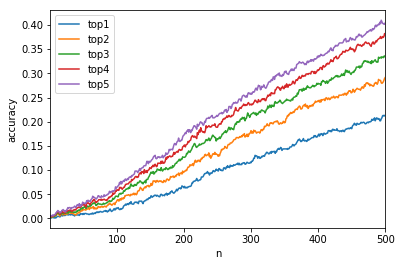

In [47]:
# top1 vs ... vs top5
drawings[['n', 'top1', 'top2', 'top3', 'top4', 'top5']].groupby('n').mean().plot()
plt.ylabel('accuracy')

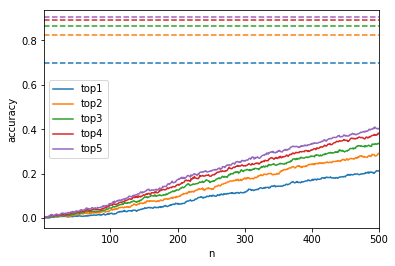

In [46]:
# top1 vs ... vs top5
drawings[['n', 'top1', 'top2', 'top3', 'top4', 'top5']].groupby('n').mean().plot()
plt.ylabel('accuracy')
plt.axhline(y=top1, linestyle='--', c='C0')
plt.axhline(y=top2, linestyle='--', c='C1')
plt.axhline(y=top3, linestyle='--', c='C2')
plt.axhline(y=top4, linestyle='--', c='C3')
plt.axhline(y=top5, linestyle='--', c='C4')

In [19]:
samples = list(set(samples))

In [49]:
# czy jakies rysunki (dla dowolnego n) mialy lepsze top1?

better_top = []
better_prob = []

for img in tqdm(samples):
    original_top1 = samples_df[samples_df.img == img]['top1'].iloc[0]
    original_top1_prob = samples_df[samples_df.img == img]['top1_prob'].iloc[0]
    drawing_top1_hit = drawings[(drawings.img == img) & (drawings.top1 == 1)]
    drawing_top1_max_prob = samples_df[samples_df.img == img]['top1_prob'].max()
    if original_top1 == 0 and not drawing_top1_hit.empty:
        better_top.append(img)
    elif original_top1_prob < drawing_top1_max_prob:
        better_prob.append(img)
        
print('rysunki, ktore maja dobra klase w top1, a oryginal nie mial = ', len(better_top))
print('rysunki, ktore maja dobra klase w top1 tak jak oryginal, ale wieksze prawd. tej klasy = ', len(better_prob))

rysunki, ktore maja dobra klase w top1, a oryginal nie mial =  41
rysunki, ktore maja dobra klase w top1 tak jak oryginal, ale wieksze prawd. tej klasy =  0


In [20]:
DRAWINGS = '/home/trejsu/projects/shaper_results/ILSVRC2012_1000_drawings'
SAMPLES = '/home/trejsu/projects/shaper_data/ILSVRC2012_1000_samples'

In [74]:
FONT_SIZE = 14

def plot_class_bars(results, fig, true_class, inner):
    top_classes = [results.iloc[0][f'top{n}_class'] for n in range(1, 6)]
    top_probs = [results.iloc[0][f'top{n}_prob'] for n in range(1, 6)]
    ax = plt.Subplot(fig, inner[0])
    fig.add_subplot(ax, edgecolor='black')
    colors = ['#D8CC34' if top_classes[i] == true_class else 'C0' for i in range(5)]
    bar_starts = [0, 0.8, 1.6, 2.4, 3.2]
    ax.barh(bar_starts, top_probs, color=colors, alpha=0.5, edgecolor='black')
    ax.set_yticks(np.arange(5))
    ax.set_yticklabels(top_classes)
    ax.invert_yaxis()
    for cls, start in zip(top_classes, bar_starts):
        ax.text(100, start + 0.15, cls, color='black', fontweight='bold', ha='right', size=FONT_SIZE)
    ax.set_axis_off()
    ax.set_xlim(0, 100)
    
def plot_img(img, fig, inner, title):
    ax = plt.Subplot(fig, inner[1])
    fig.add_subplot(ax)
    ax.imshow(img)
    ax.set_axis_off()
    ax.set_title(title, fontweight='bold', size=FONT_SIZE)
    
def get_inner(outer):
    return gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer)

def get_ns(n):
    result = [10, 50, 100, 200, 300, 400, 500]
    if n < 10:
        result[0] = n
        return result
    
    for i, x in enumerate(zip(result, result[1:])):
        curr, nex = x
        if n < nex:
            if abs(curr - n) < abs(nex - n):
                result[i] = n
                return result
            else:
                result[i+1] = n
                return result
    return result 

In [75]:
def plot_images(names, path, n=None):
    for idx, image in enumerate(names):

        ns = [10, 50, 100, 200, 300, 400, 500] if n is None else get_ns(n[idx])
        
        original_img = mimg.imread(os.path.join(SAMPLES, f'{image}.JPEG'))

        fig = plt.figure(figsize=(16, 10))
        outer = gridspec.GridSpec(2, 4)

        original_results = samples_df[samples_df.img == image]
        true_class = original_results.iloc[0]['true_class']

        for i in range(7):
            inner = get_inner(outer[i])
            results = drawings[(drawings.img == image) & (drawings.n == ns[i])]
            plot_class_bars(results, fig, true_class, inner)
            img = mimg.imread(os.path.join(DRAWINGS, f'{image}-{ns[i]}.jpg'))
            plot_img(img, fig, inner, f'n={ns[i]}')

        inner = get_inner(outer[7])
        plot_class_bars(original_results, fig, true_class, inner)
        plot_img(original_img, fig, inner, 'original')

        plt.suptitle(true_class, size=25)
        plt.savefig(path % idx)
        plt.show()
        

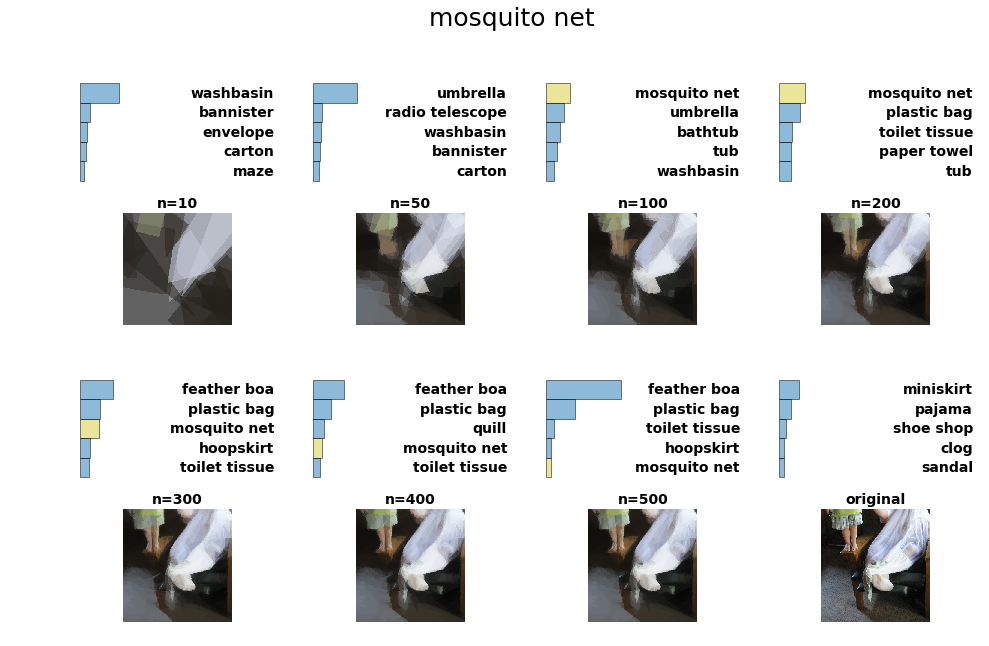

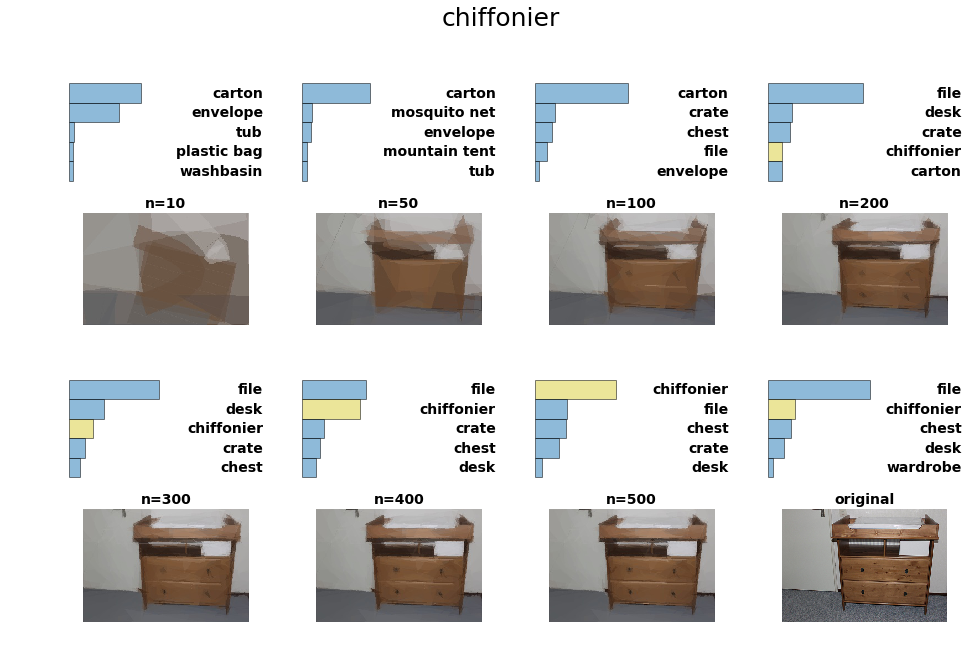

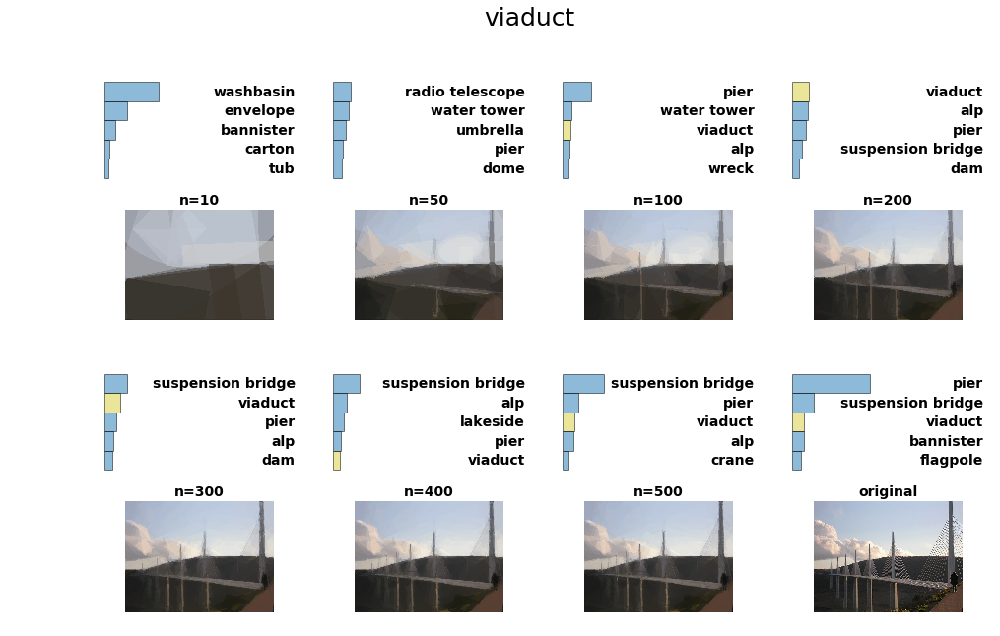

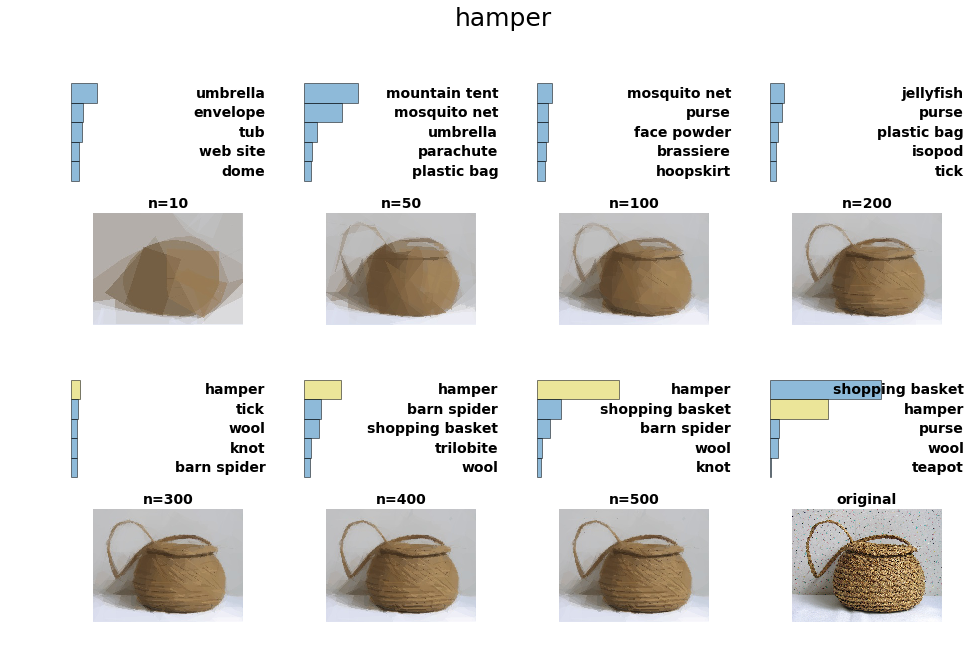

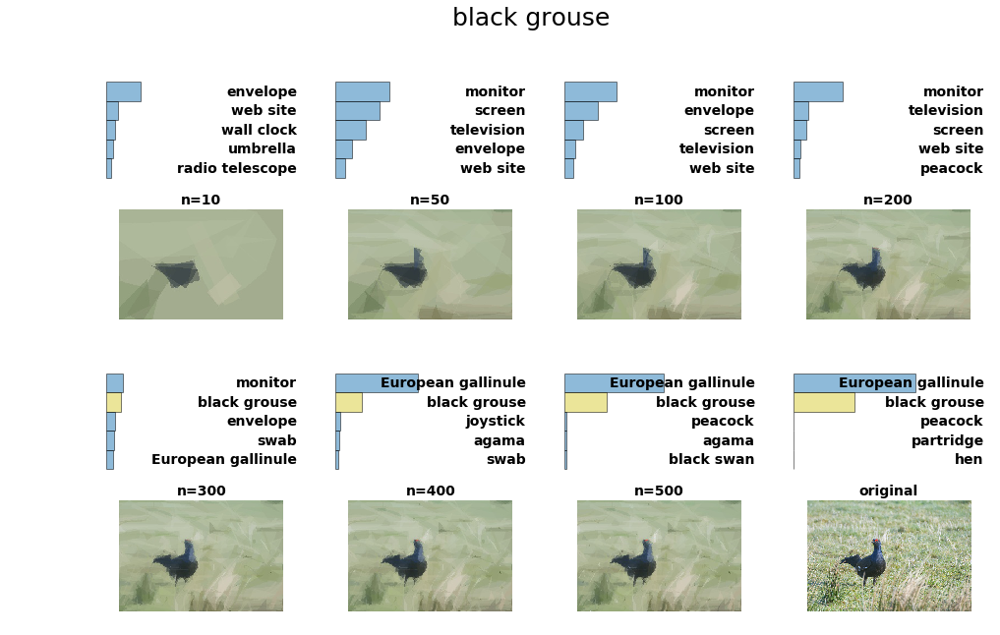

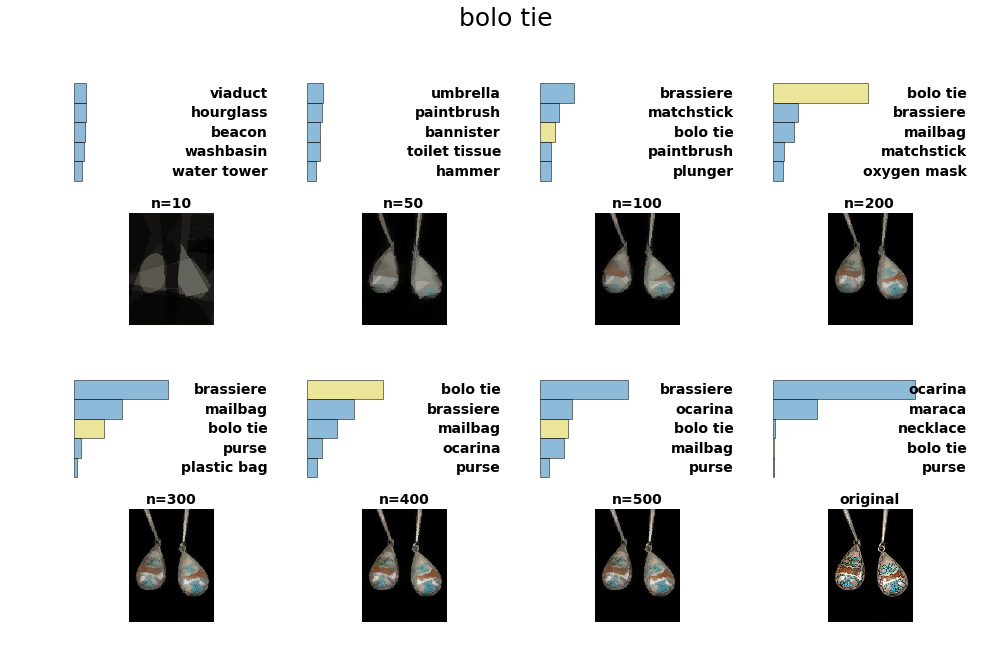

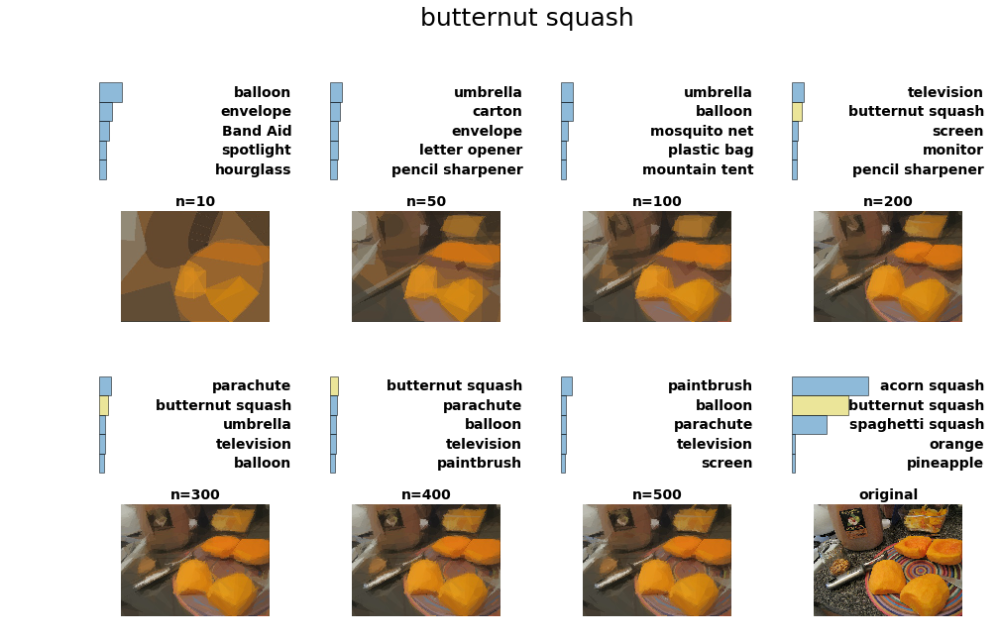

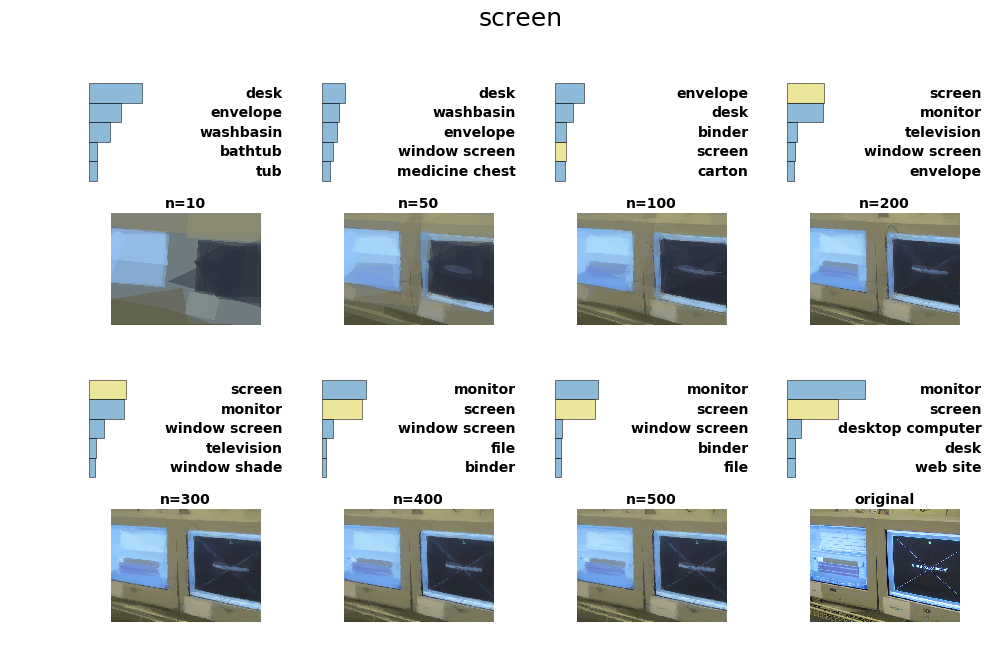

KeyboardInterrupt: 

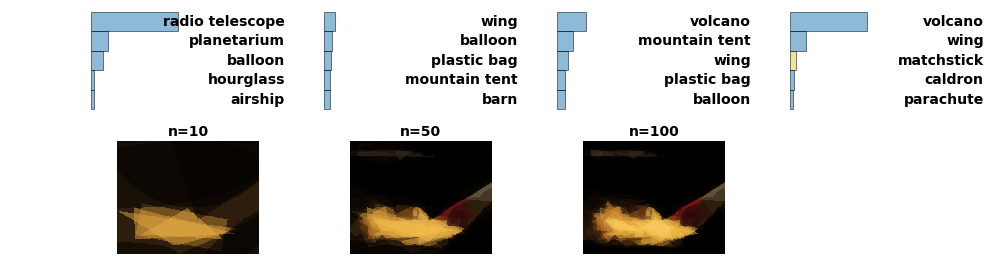

In [344]:
# rysunki, ktore dla ktoregos n mialy przewidywana klase (top1) prawidlowa a oryginal nie mial
plot_images(names=better_top, path='/home/trejsu/projects/shaper_results/imagenet-classification/better-top1/better-top1-%d.png')

In [ ]:
# rysunki, ktore maja top1_class = true_class i top1_prob > 90%
high_probs = []
for img in tqdm(samples):
    match = drawings[(drawings.img == img) & (drawings.top1 == 1) & (drawings.top1_prob > 90)]
    if not match.empty:
        high_probs.append(img)
        
print(len(high_probs))

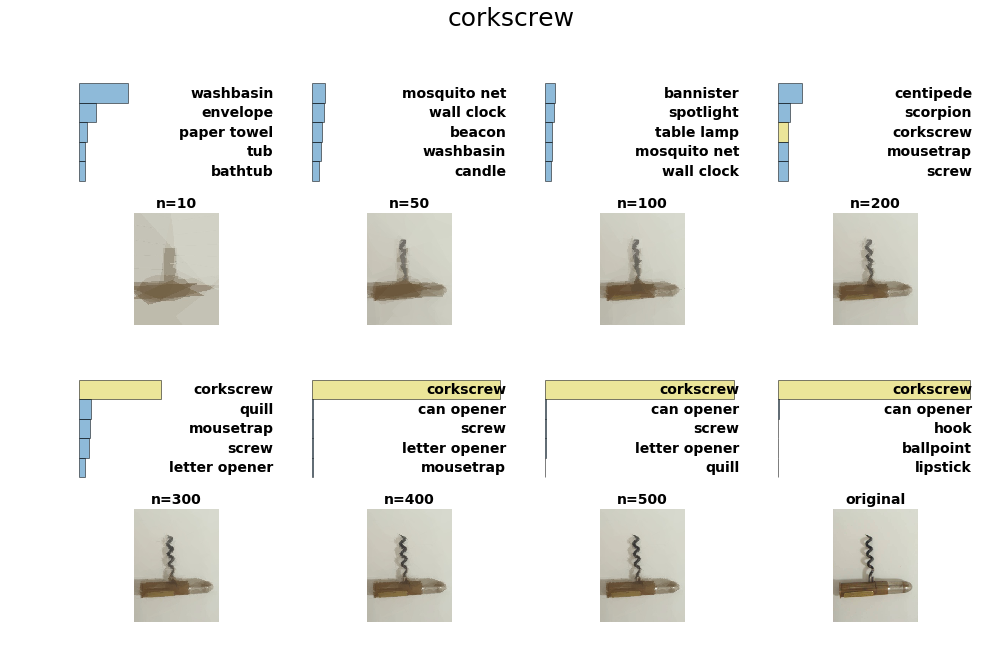

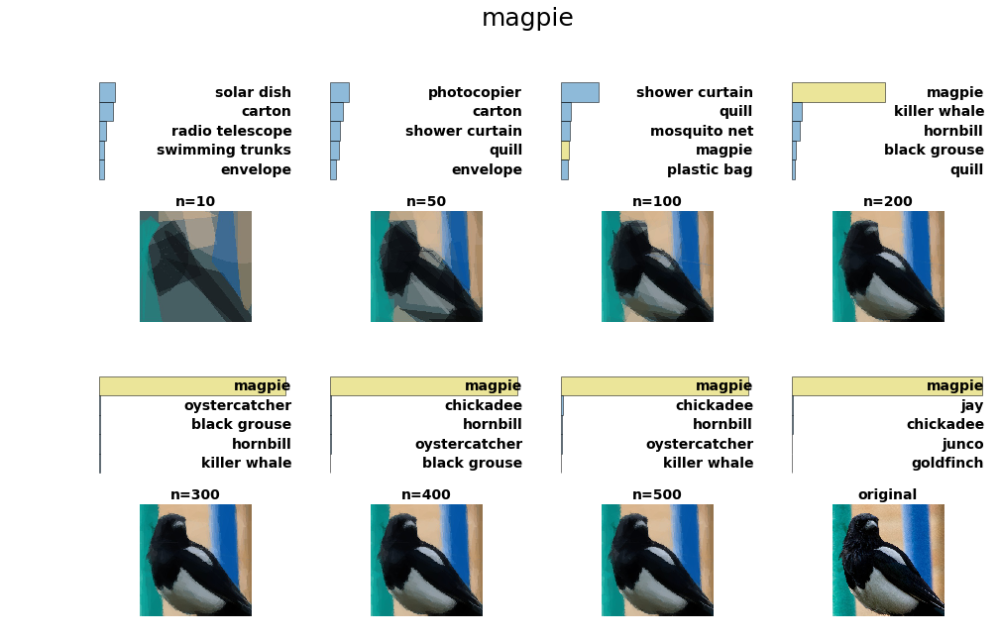

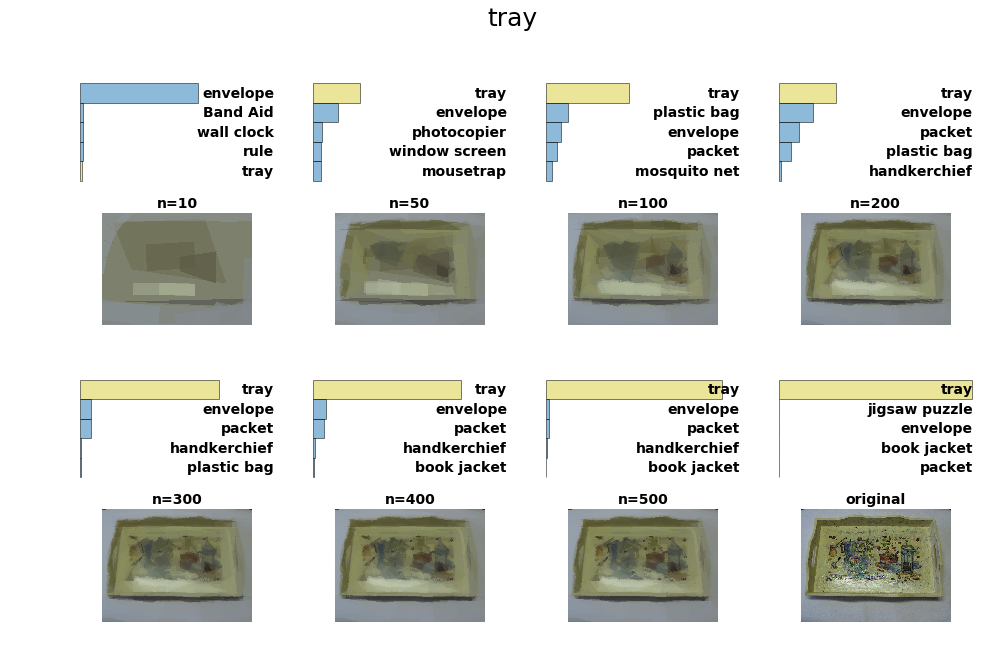

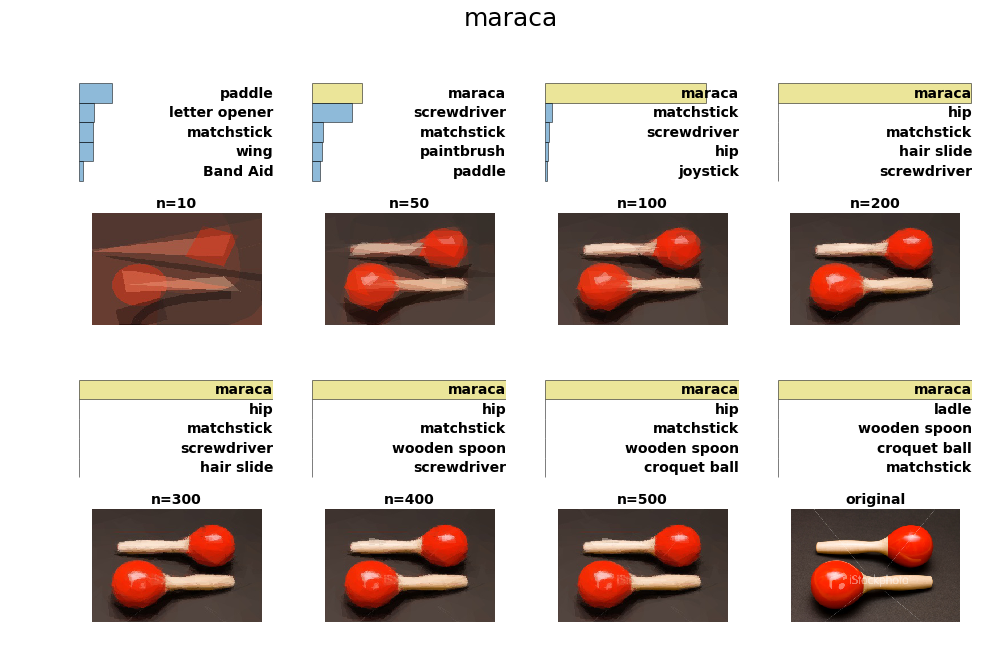

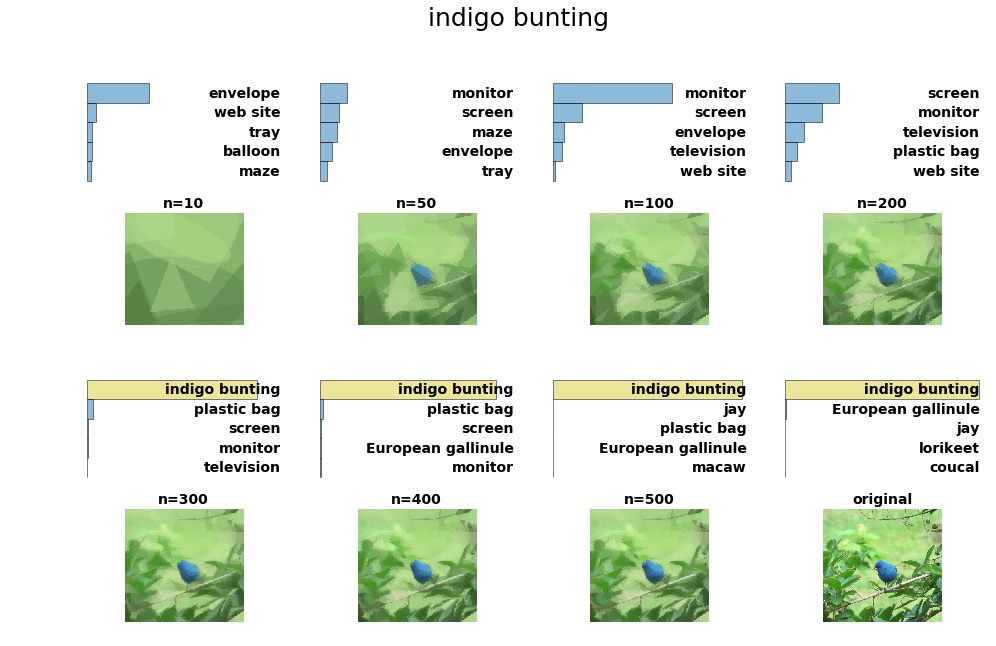

...

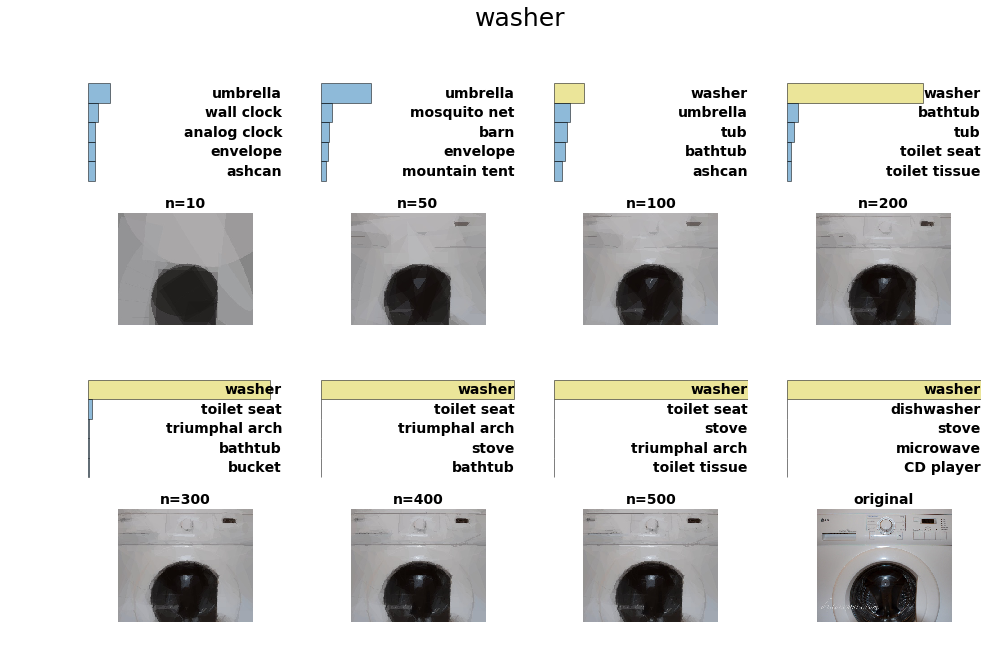

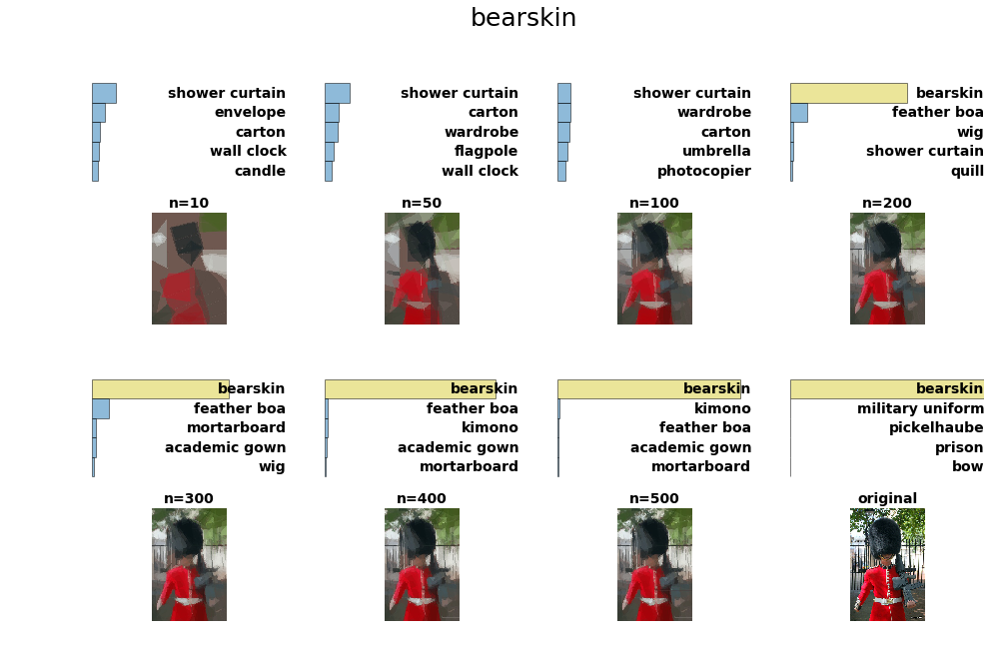

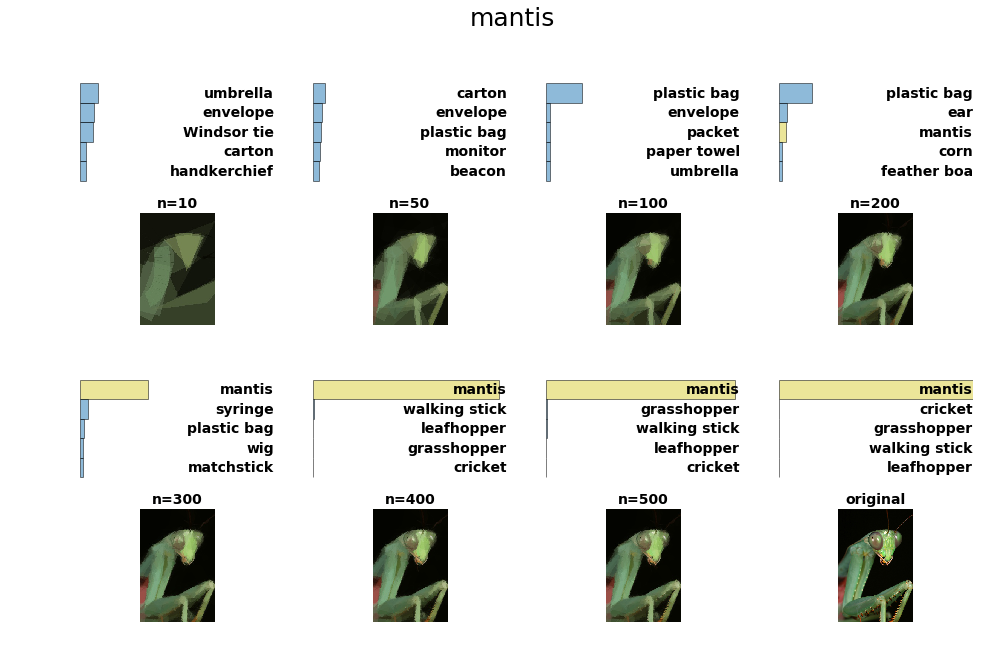

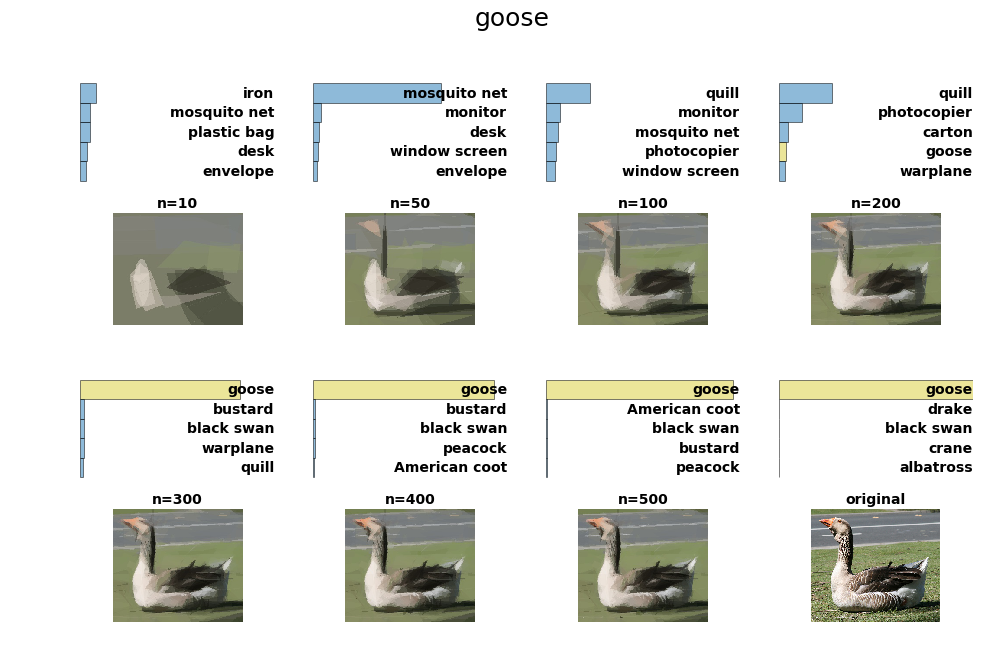

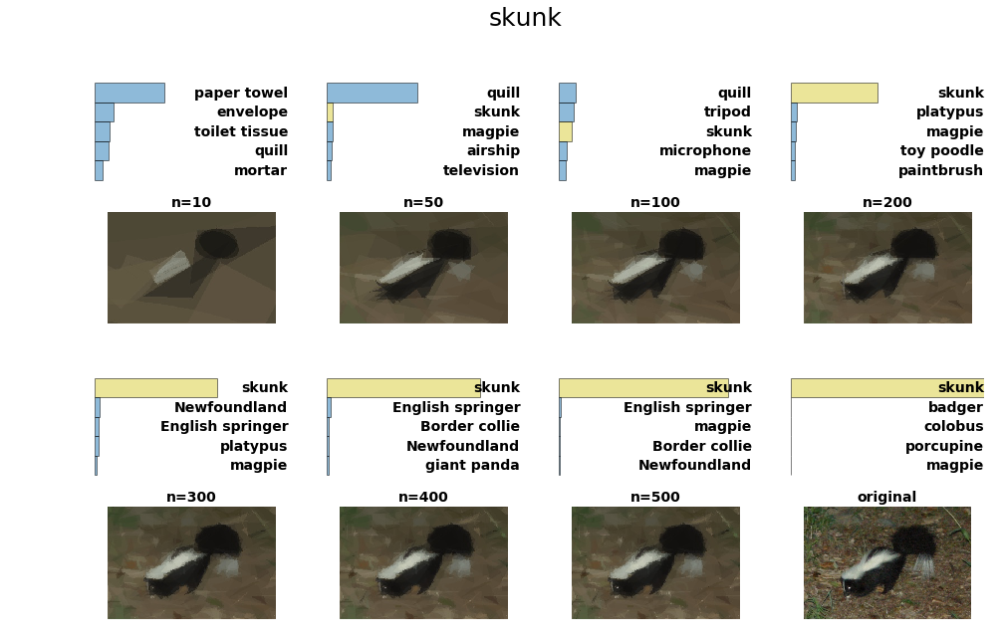

In [345]:
plot_images(names=high_probs, path='/home/trejsu/projects/shaper_results/imagenet-classification/high_probs/high_probs-%d.png')

In [366]:
# rysunki, ktore maja zla top1_class i top1_prob > 95% (dla n >= 10 - zeby wykluczyc przypadki z envelope itd)
high_probs_wrong_class = []
ns = []

for img in tqdm(samples):
    match = drawings[(drawings.img == img) & (drawings.top1 == 0) & (drawings.top1_prob > 95) & (drawings.n > 9)]
    if not match.empty:
        max_prob = match.top1_prob.max()
        n = drawings[(drawings.img == img) & (drawings.top1 == 0) & (drawings.top1_prob == max_prob) & (drawings.n > 9)].n.iloc[0]
        ns.append(n)
        high_probs_wrong_class.append(img)
        
print(len(high_probs_wrong_class))

13


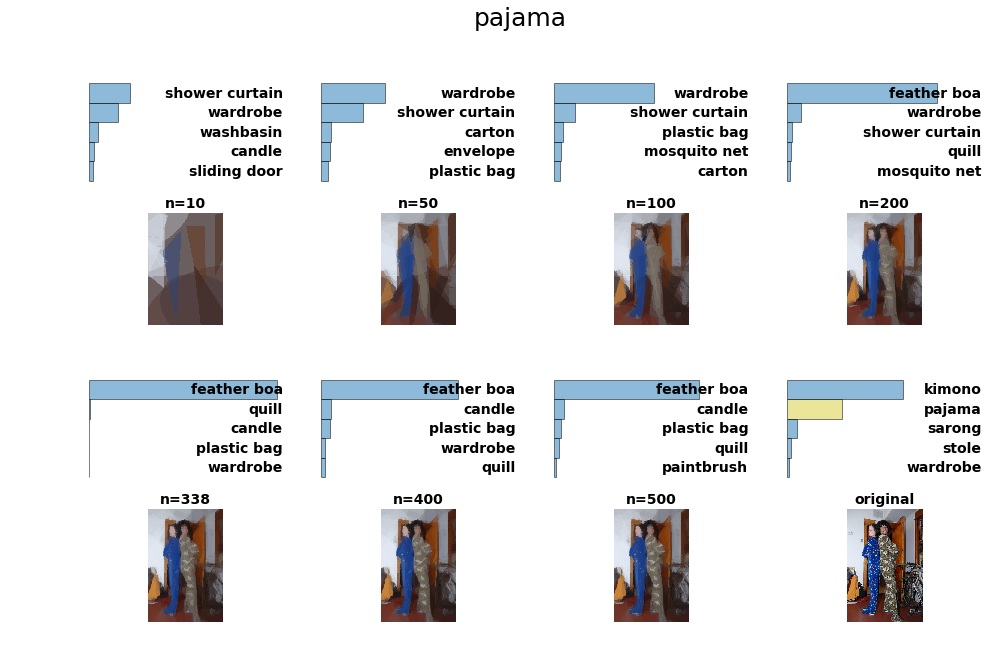

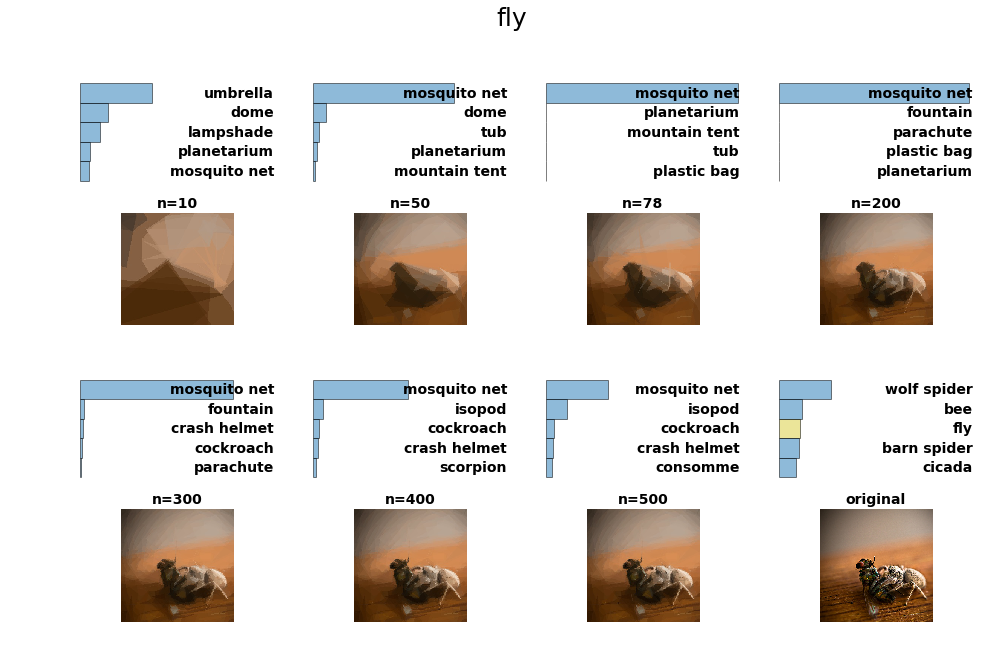

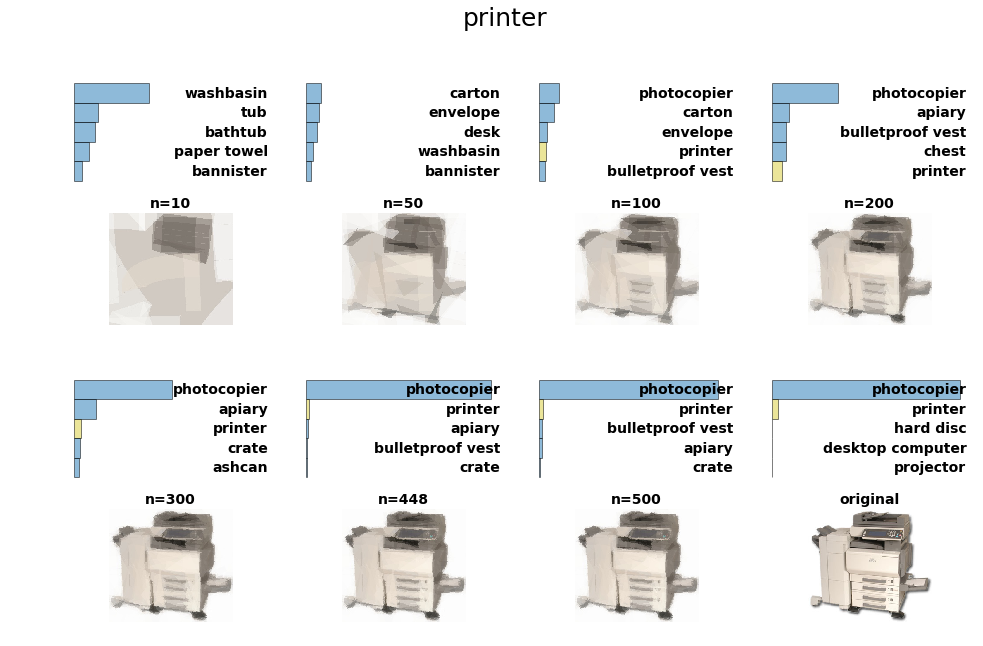

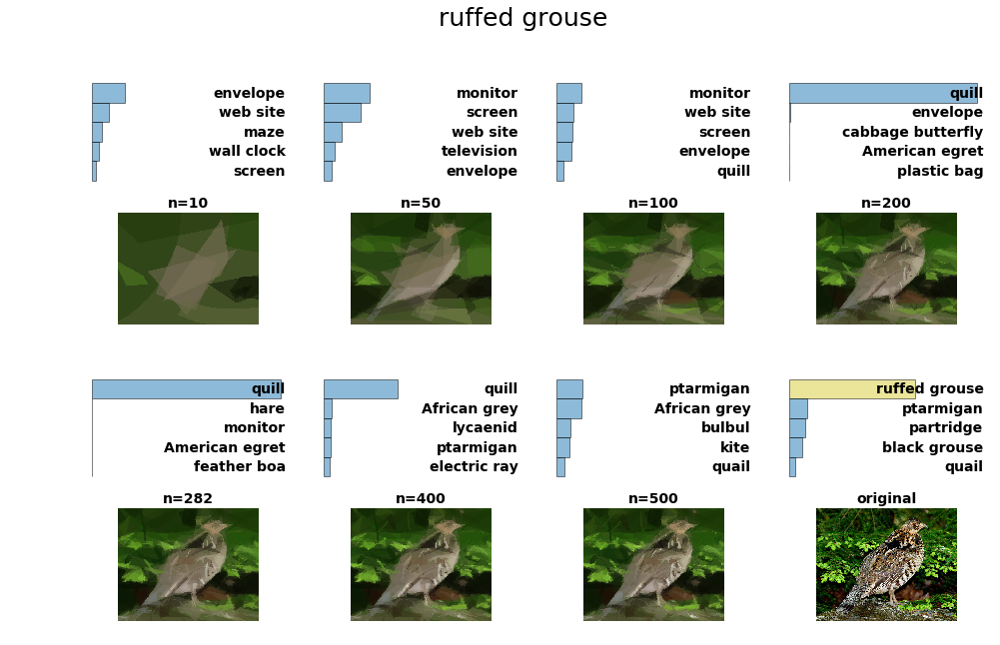

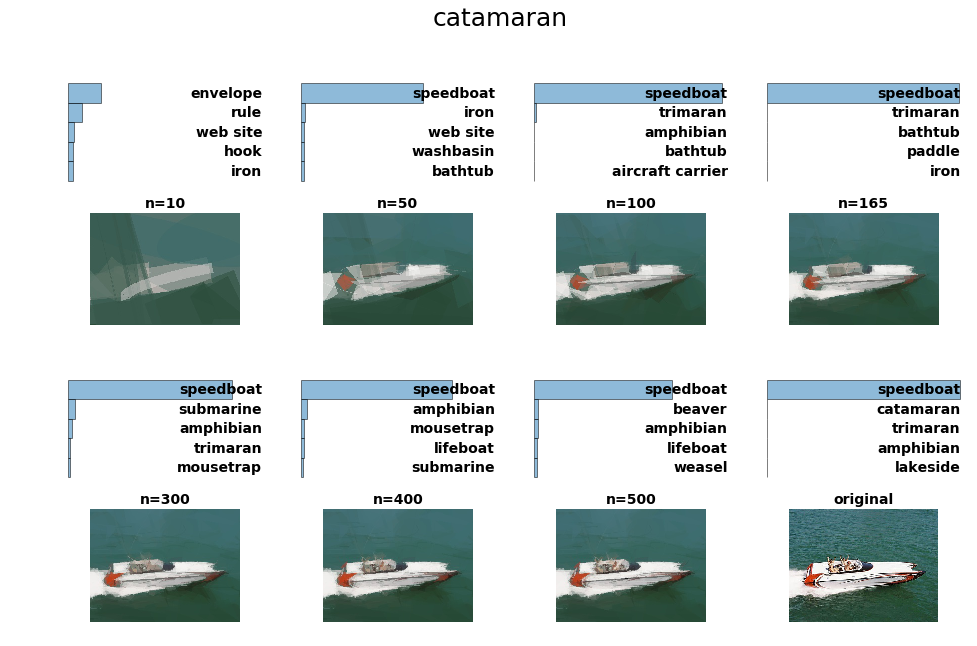

...

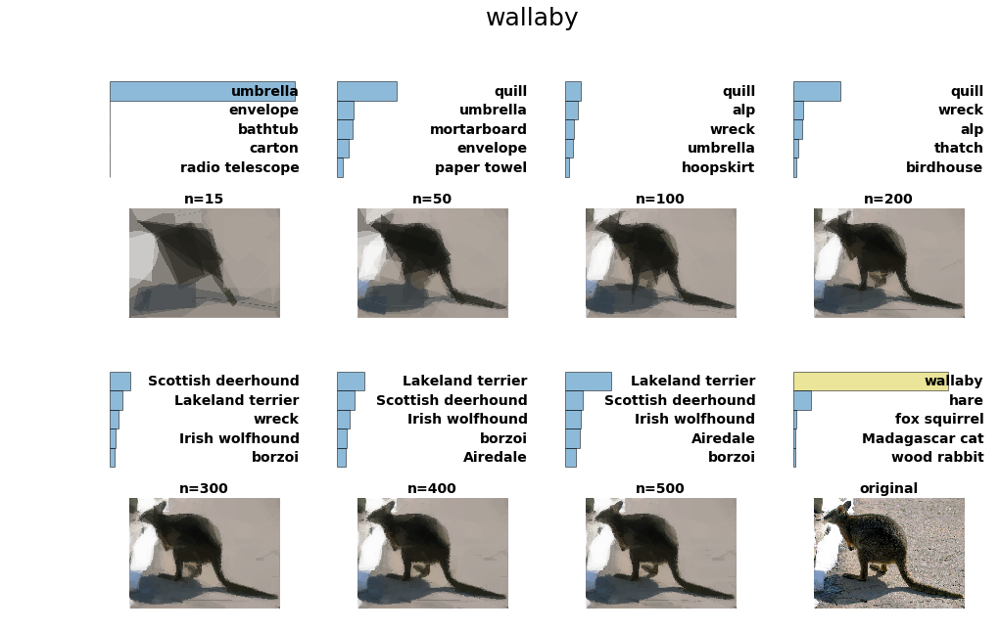

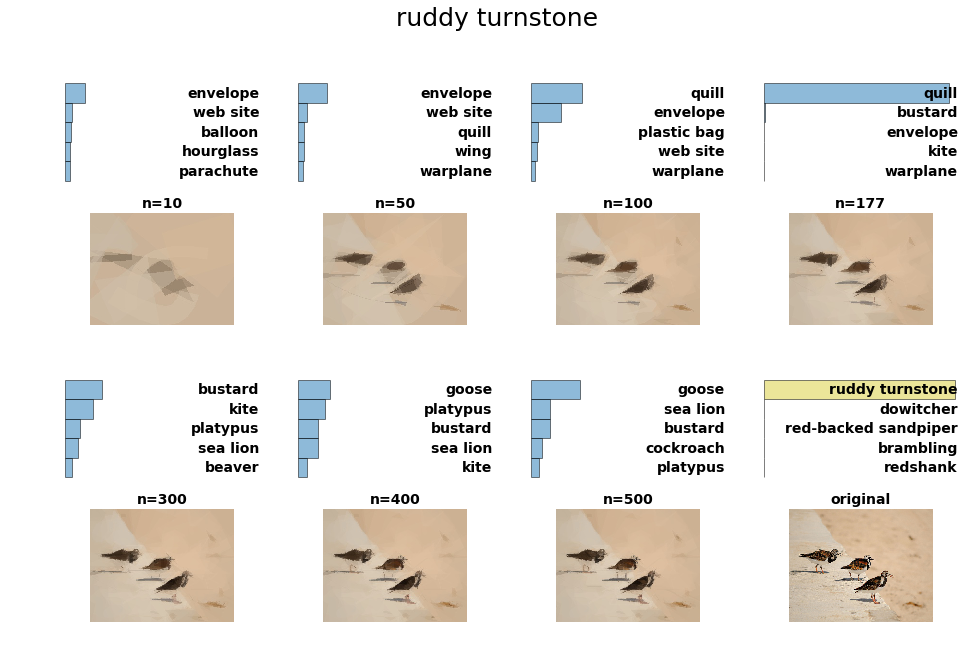

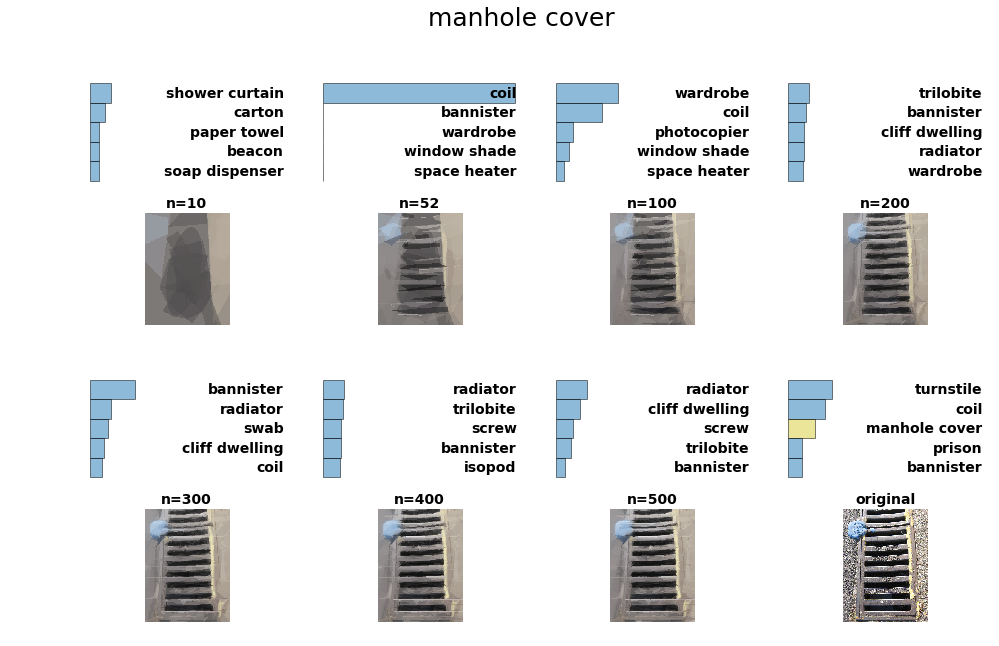

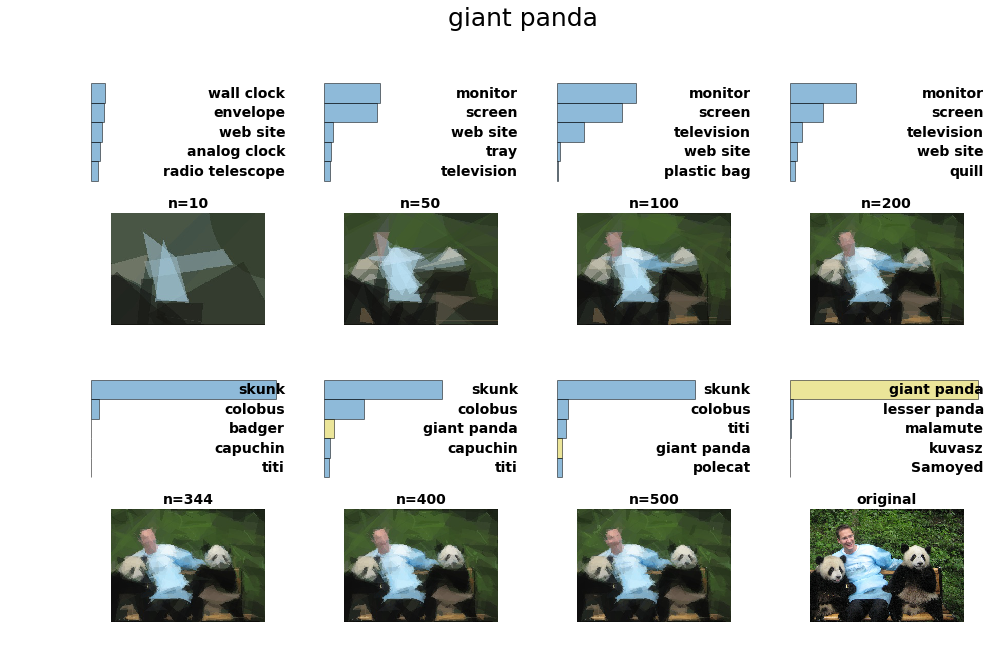

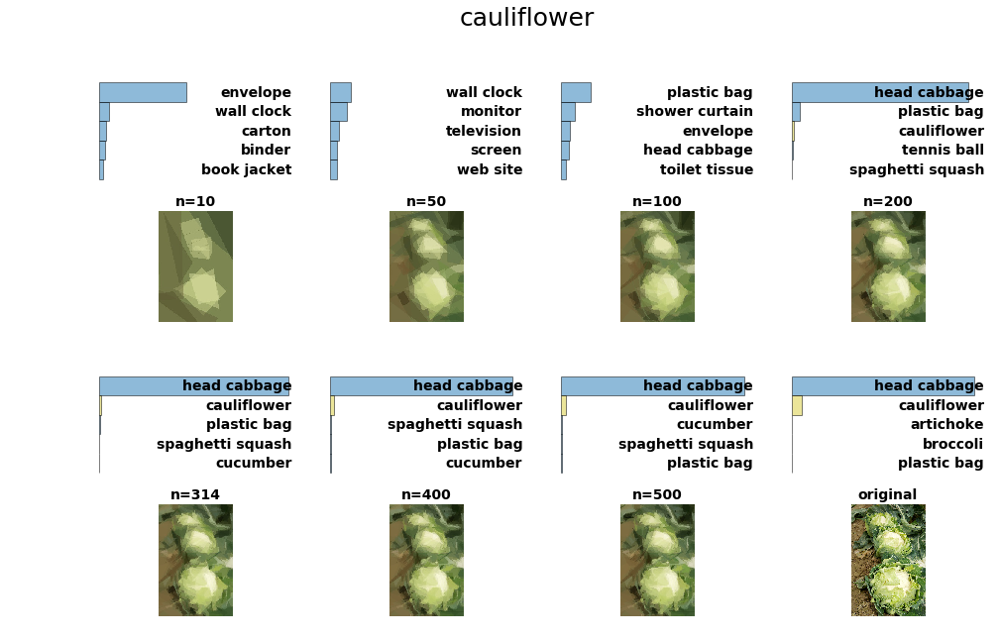

In [367]:
plot_images(
    names=high_probs_wrong_class, 
    path='/home/trejsu/projects/shaper_results/imagenet-classification/high_probs_wrong_class/high_probs_wrong_class-%d.png', 
    n=ns
)

In [373]:
GIFS = '/home/trejsu/projects/shaper_results/imagenet-classification/gifs'

In [405]:
# obrazki na gify
for idx, image in tqdm(enumerate(samples[666:667])):

    ns = range(1, 501)

    original_results = samples_df[samples_df.img == image]
    true_class = original_results.iloc[0]['true_class']
    
    path = os.path.join(GIFS, image)
    if not os.path.exists(path):
        os.mkdir(path)

    for i in range(len(ns)):
        fig = plt.figure(figsize=(4, 5))
        outer = gridspec.GridSpec(1, 1)
        inner = get_inner(i=0)
        results = drawings[(drawings.img == image) & (drawings.n == ns[i])]
        plot_class_bars(results, fig, true_class, inner)
        img = mimg.imread(os.path.join(DRAWINGS, f'{image}-{ns[i]}.jpg'))
        plot_img(img, fig, inner, f'n={ns[i]}')
        plt.savefig(os.path.join(path, f'{image}-{i}.png'))
        plt.close(fig)

In [395]:
import re

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

In [397]:
# stworzenie gifów
dirs = os.listdir(GIFS)
for d in dirs:
    dir_path = os.path.join(GIFS, d)
    plots = os.listdir(dir_path)
    plots.sort(key=natural_keys)
    images = [imageio.imread(os.path.join(dir_path, p)) for p in tqdm(plots)]
    imageio.mimsave(os.path.join(dir_path, d + '.gif'), images, duration=0.25)

In [67]:
counted = drawings[['img', 'n', 'top1_class']].groupby(['img']).nunique()

In [68]:
# średnia ilość klas top1 w ramach jednego rysunku
counted['top1_class'].mean()

9.016309887869522

In [69]:
# max ilość klas top1 w ramach jednego rysunku
counted['top1_class'].max()

24

In [70]:
# min ilość klas top1 w ramach jednego rysunku
counted['top1_class'].min()

1

In [71]:
# obrazki, które dla wszystkich n klasyfikują się tak samo
counted[counted['top1_class'] == 1]

,img,n,top1_class
img,,,
ILSVRC2012_val_00013913,1,500,1


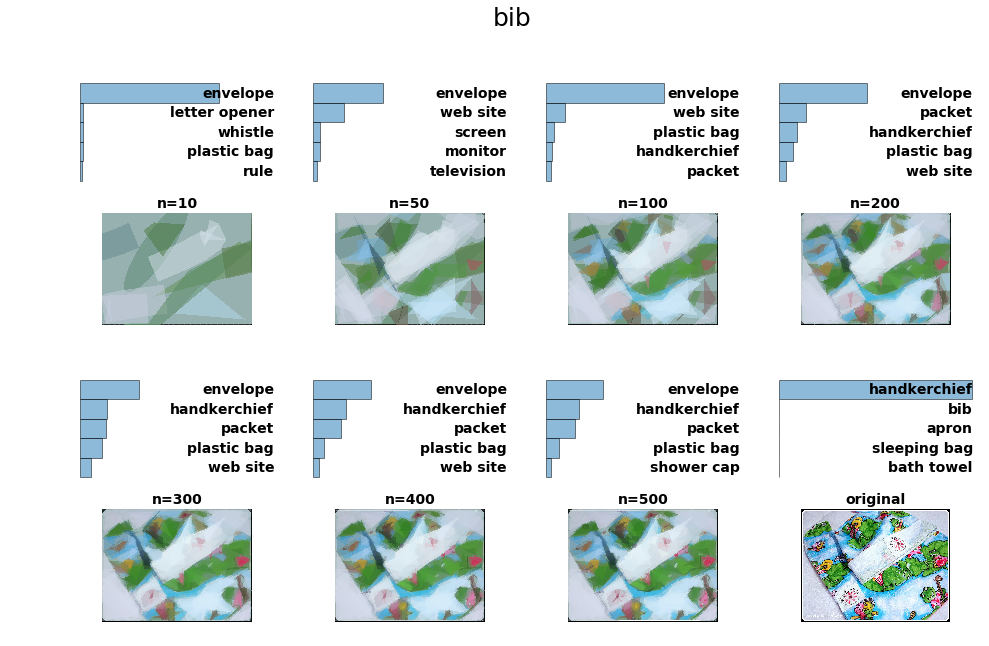

In [76]:
plot_images(names=['ILSVRC2012_val_00013913'], path='/home/trejsu/projects/shaper_results/imagenet-classification/the-same-top1-class/the-same-top1-class-%d.png')

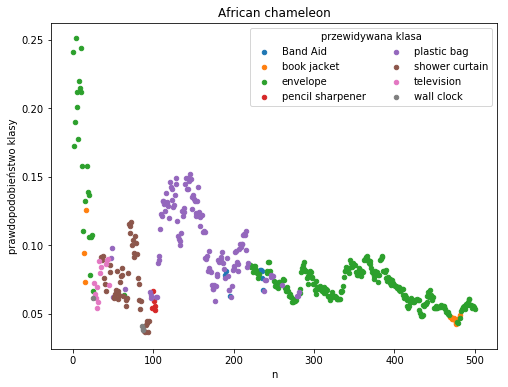

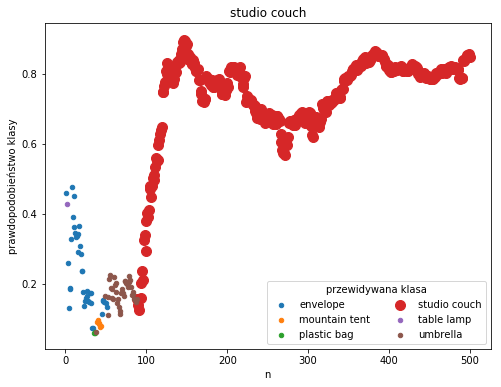

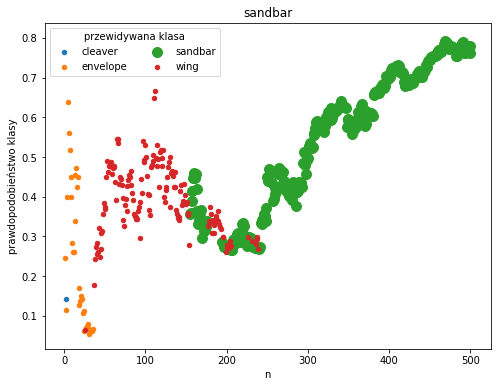

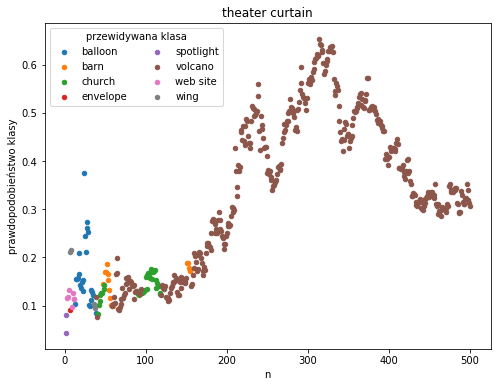

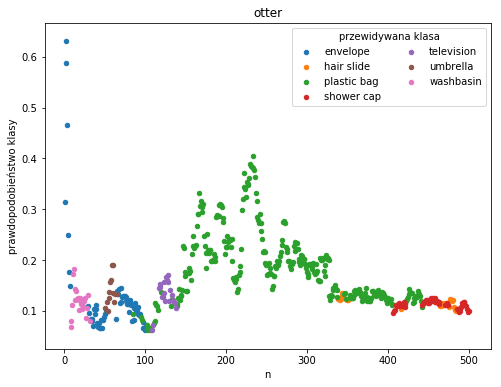

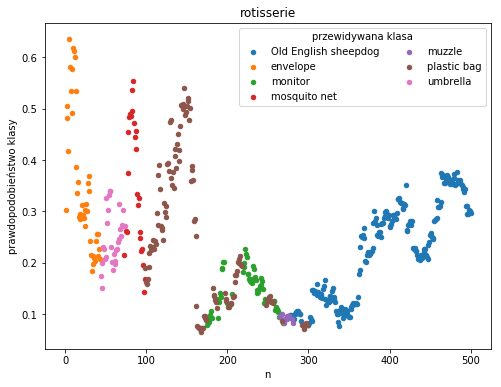

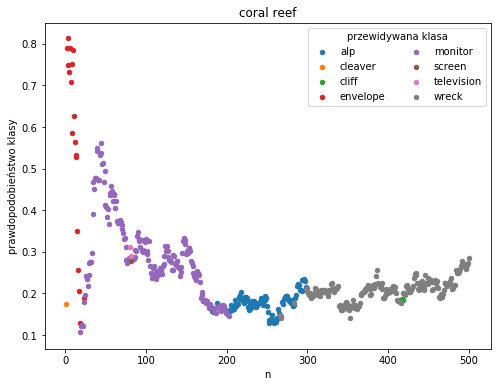

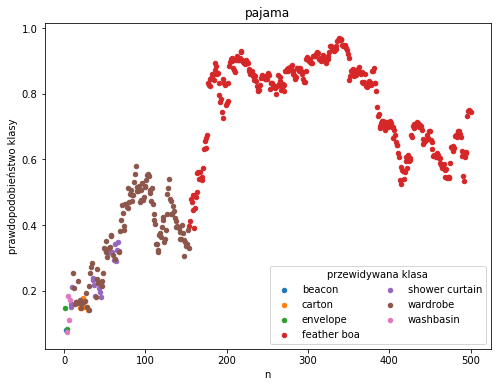

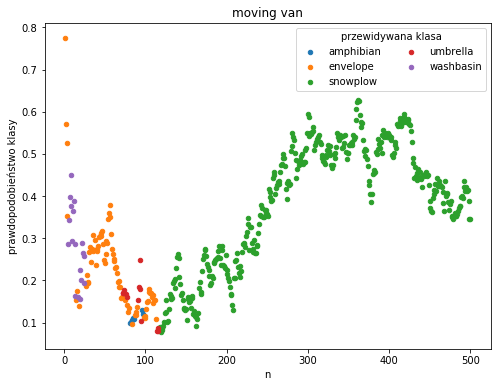

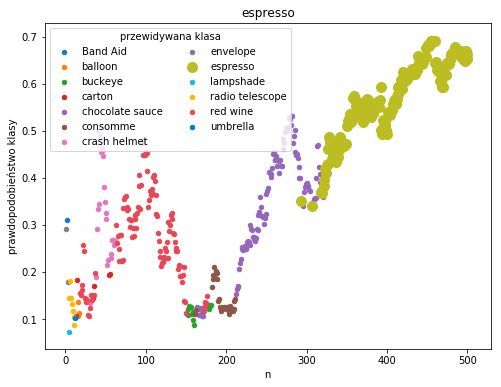

In [125]:
# wykres zmian klasy top1

PATH = '/home/trejsu/projects/shaper_results/imagenet-classification/top1-changes'
drawings_copy = drawings.copy()
drawings_copy['top1_prob'] = drawings_copy['top1_prob'].apply(lambda x: x / 100)

for i, image in tqdm(enumerate(samples[100:110])):
    fig, ax = plt.subplots(figsize=(8,6))
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', '#FFB900', '#E74856', '#0078D7', '#0099BC', '#107C10', '#10893E', '#881798', '#9A0089', '#FF4343', '#F7630C', '#EA005E', '#8E8CD8', '#00B7C3', '#498205', '#00CC6A', '#B146C2', '#D13438', '#C239B3', '#FF8C00', '#E81123', '#0063B1', '#2D7D9A', '#00B294', '#E3008C']
    groupped = drawings_copy[drawings_copy.img == image].sort_values(by=['n']).groupby(['top1_class'])
    true_class = samples_df[samples_df.img == image].iloc[0]['true_class']
    for idx, g in enumerate(groupped):
        label, df = g
        size = 100 if label == true_class else 20
        df.plot(x='n', y='top1_prob', ax=ax, label=label, color=colors[idx], kind='scatter', s=size)
    plt.legend(title='przewidywana klasa', ncol=2)
    plt.title(true_class)
    plt.ylabel('prawdopodobieństwo klasy')
#     plt.savefig(os.path.join(PATH, f'{image}-{i}.png'))
#     plt.close(fig)

In [163]:
# wykres średnich zmian prawdopodobieństwa top1 == true class

PATH = '/home/trejsu/projects/shaper_results/imagenet-classification/top1-mean-prob-changes'
dc = drawings.copy()
dc['top1_prob'] = dc['top1_prob'].apply(lambda x: x / 100)
dc['top2_prob'] = dc['top2_prob'].apply(lambda x: x / 100)
dc['top3_prob'] = dc['top3_prob'].apply(lambda x: x / 100)
dc['top4_prob'] = dc['top4_prob'].apply(lambda x: x / 100)
dc['top5_prob'] = dc['top5_prob'].apply(lambda x: x / 100)
dc.n = dc.n.astype(np.int64)
tops = dc[['top1', 'top2', 'top3', 'top4', 'top5']].sum(axis=1)
top1 = tops[tops == 5]
top2 = tops[tops == 4]
top3 = tops[tops == 3]
top4 = tops[tops == 2]
top5 = tops[tops == 1]

ValueError: scatter requires x column to be numeric

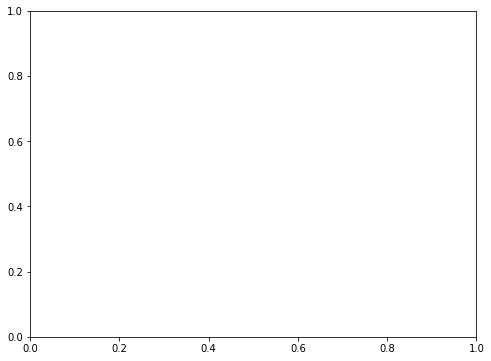

In [173]:
def plot_topn(topn, n):
    df = dc[(dc.img == image) & dc.top1 == 1].sort_values(by=['n'])
    if not df.empty:
        df.plot(x='n', y=f'top{n}_prob', ax=ax, kind='scatter', alpha=0.05)
    else:
        # TODO
        df.plot(x='n', y=np.zeros(500,), kind='scatter', alpha=0.05) 

fig, ax = plt.subplots(figsize=(8,6))
for image in tqdm(samples[0:100]):
    plot_topn(top1, 1)

plt.ylabel('prawdopodobieństwo klasy')
plt.show()

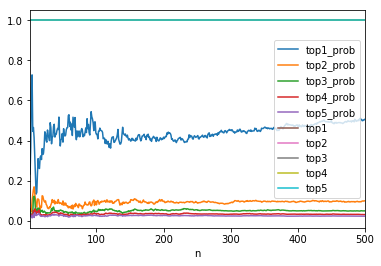

In [166]:
# średnie prawdopodobieństwo prawdziwej klasy